In [1]:
import scipy.io.arff 

In [2]:
import matplotlib.pyplot as plt

In [4]:
arff = scipy.io.arff.loadarff("Dry_Bean_Dataset.arff")

In [5]:
import pandas as pd

In [7]:
drybean = pd.DataFrame(arff[0])

## Premier aperçu

In [9]:
drybean.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395.0,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,b'SEKER'
1,28734.0,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,b'SEKER'
2,29380.0,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,b'SEKER'
3,30008.0,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,b'SEKER'
4,30140.0,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,b'SEKER'


## Dimensions

In [15]:
drybean.shape

(13611, 17)

# EXPLORATORY DATA ANALYSIS
**Objectifs:** Comprendre au maximum les données dont on dispose pour élaborer une bonne statégie de modélisation.
*Checklist de base (Non exhaustive)*

## Analyse de la forme
- **Identification de la target y:** Class
- **Dimensions du dataset:** (13611, 17)
- **Types des variables:** Tout est float sauf la class
- **Identification et quantification des valeurs manquantes:** Aucunes valeurs manquantes
  
## Analyse du fond
- **Visualistaion de la target** (Histogramme/Boxplot):
  - Les classes sont déséquilibrées:
    - 'DERMASON'    3546 - 30.4%
    - 'SIRA'        2636 - 22.75%
    - 'SEKER'       2027 - 17.5%
    - 'HOROZ'       1928 - 16.64%
    - 'CALI'        1630 - 14.07%
    - 'BARBUNYA'    1322 - 11.41%
    - 'BOMBAY'       522 - 4.5%
- **Compréhension des différentes variables**:Il semble que toutes ses varaiables  ont une distribution asymétrique. Besoin d'etre normalisées.
- **Visualisation des relations  features-target** (Histogramme/Boxplot ou touts autres graphes matplotlib ou seaborn): Certaines espèces se démarque très facilement des autres notamment:
  - Bombay (Area, Perimeter, MajorAxisLenght, MinorAxisLength, ConvexArea, EquivDiameter, ShapeFactor1)
  - Seker et Horoz (Eccentricty, compactness, ShapeFactor3)
  - Horoz (extent)
- **Identification des outliers:** Pas mal de Outliers

# CONCLUSION
Analyse très concluente, On a affaire à un dataset de taille relativement modeste, les varaibles sont toutes de la meme catégorie. Nous remarquons la présence de variables très discrimminantes, nous encourageant à continuer l'exploration.

In [18]:
bean = drybean.copy()

## Première anamyse du dataset

In [21]:
bean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  float64
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  float64
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [23]:
bean.dtypes

Area               float64
Perimeter          float64
MajorAxisLength    float64
MinorAxisLength    float64
AspectRation       float64
Eccentricity       float64
ConvexArea         float64
EquivDiameter      float64
Extent             float64
Solidity           float64
roundness          float64
Compactness        float64
ShapeFactor1       float64
ShapeFactor2       float64
ShapeFactor3       float64
ShapeFactor4       float64
Class               object
dtype: object

In [25]:
import seaborn as sb

In [26]:
bean.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


## Types de variables

# Analyse de la target

<Axes: xlabel='Class', ylabel='Count'>

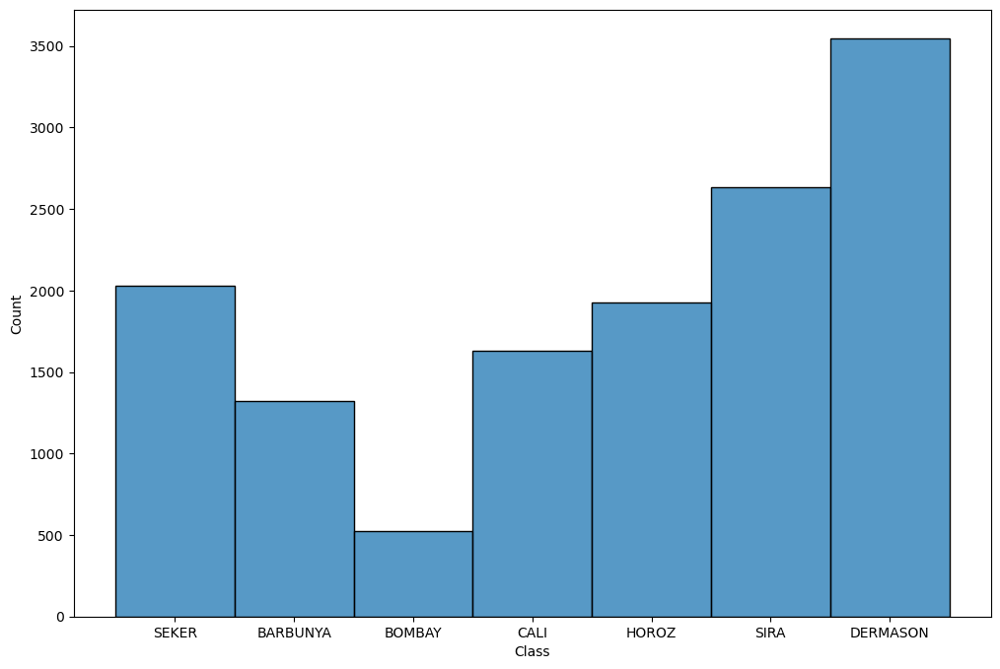

In [33]:
plt.figure(figsize=(12, 8))
sb.histplot(bean["Class"])

In [34]:
bean["Class"].value_counts()

Class
b'DERMASON'    3546
b'SIRA'        2636
b'SEKER'       2027
b'HOROZ'       1928
b'CALI'        1630
b'BARBUNYA'    1322
b'BOMBAY'       522
Name: count, dtype: int64

## Analyse des features

In [38]:
flottaison = bean.select_dtypes("float64")

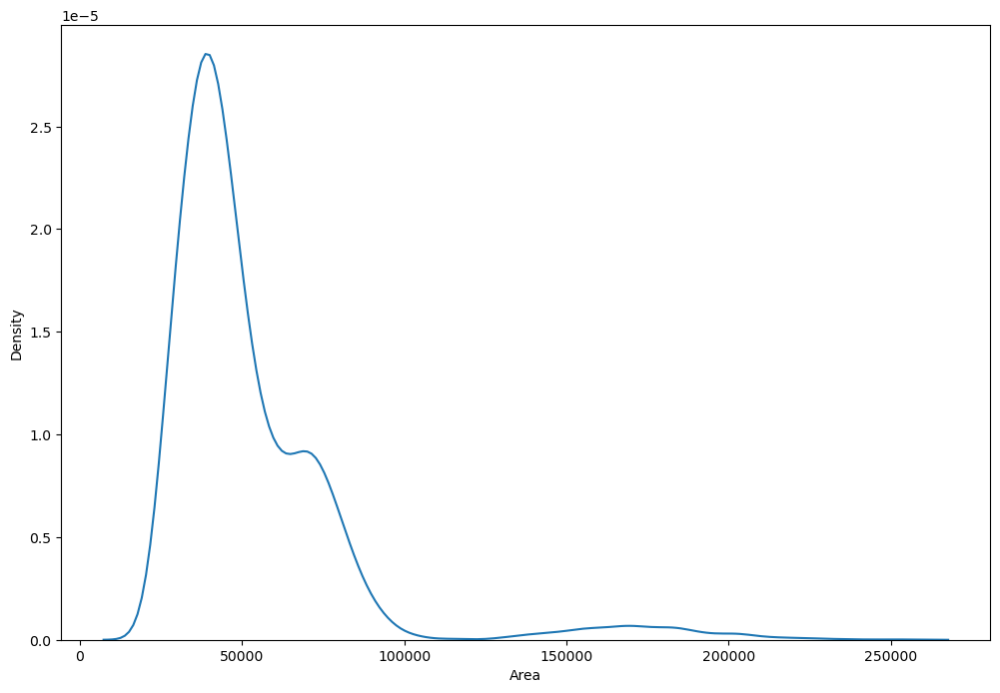

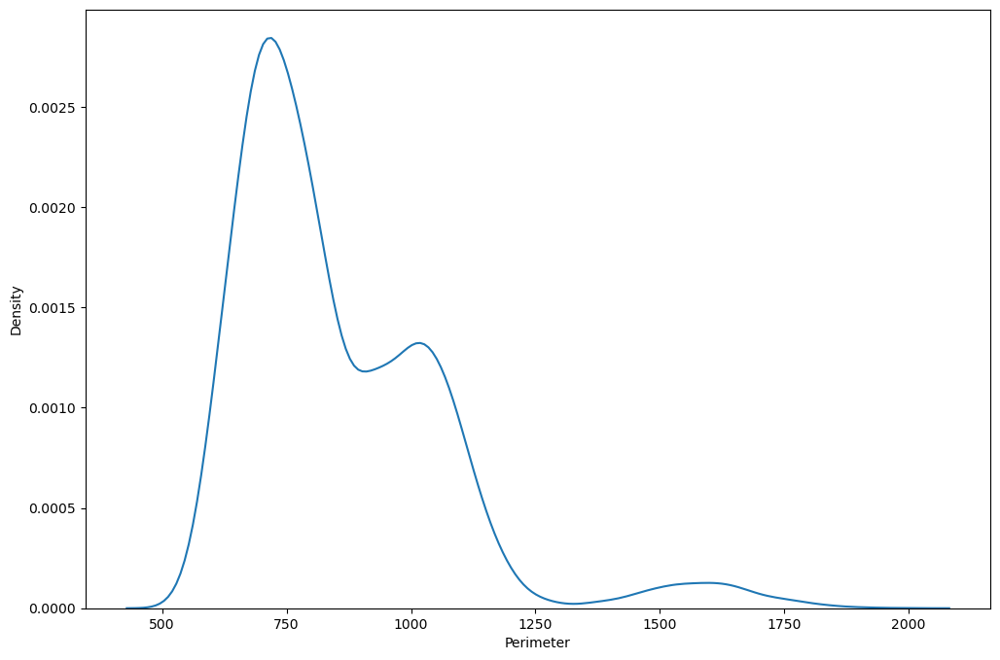

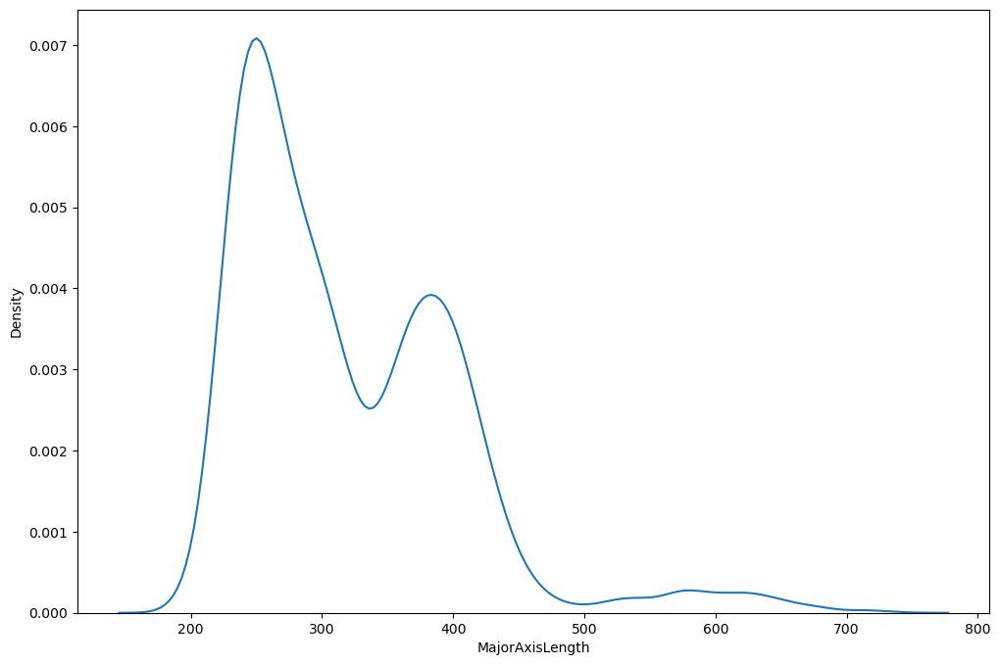

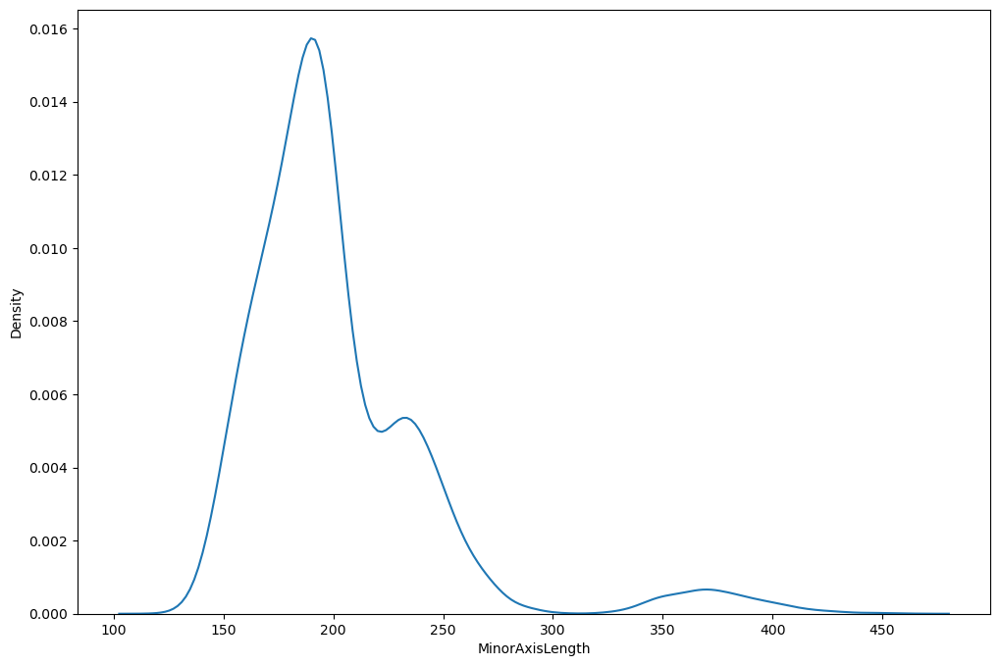

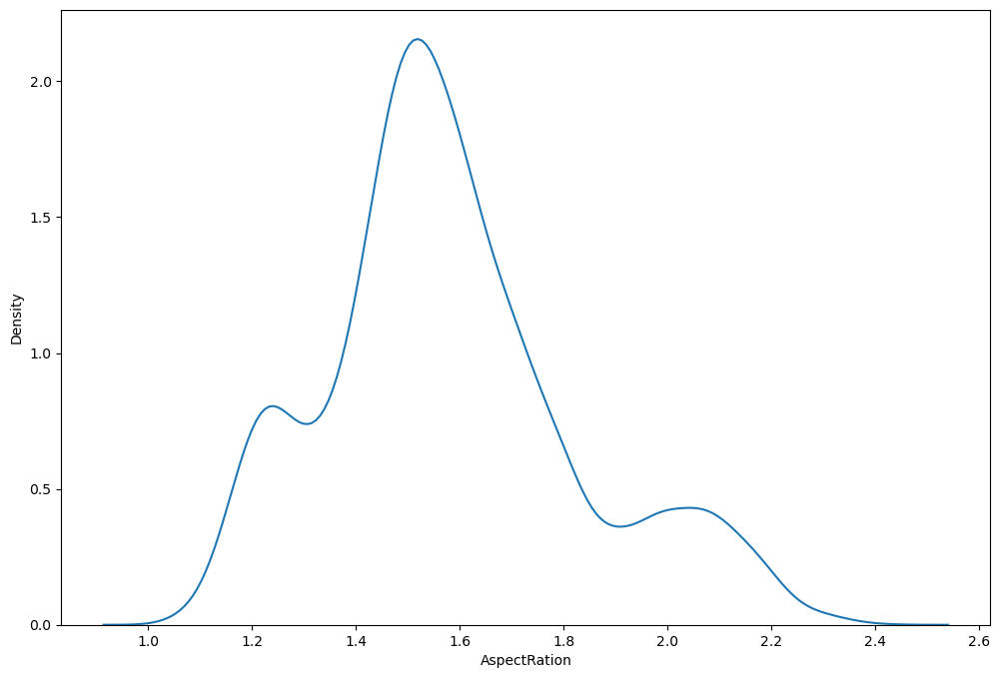

...

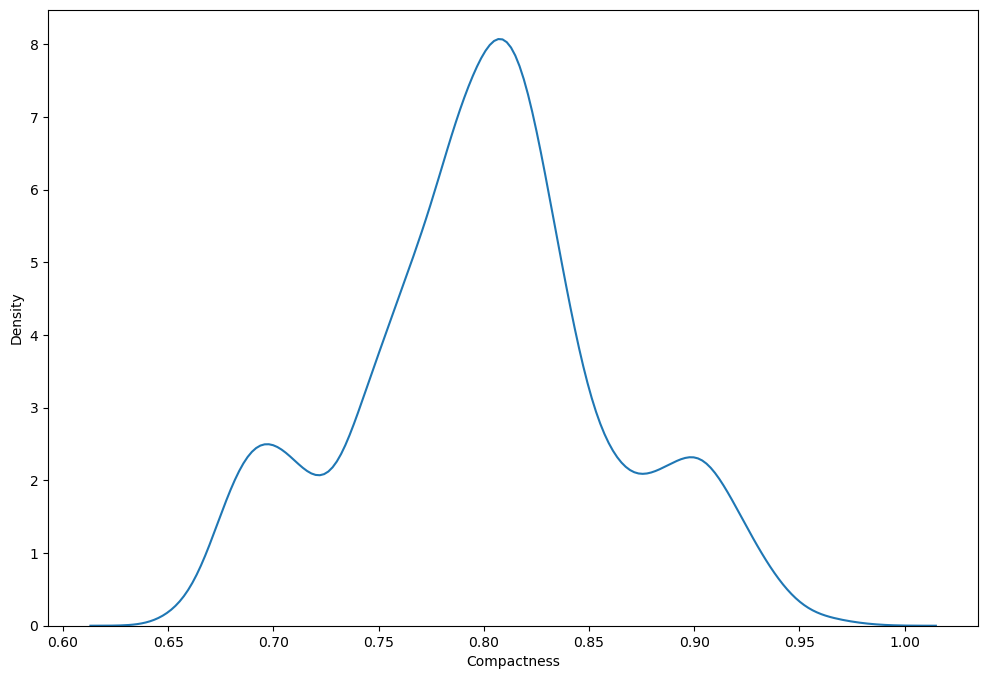

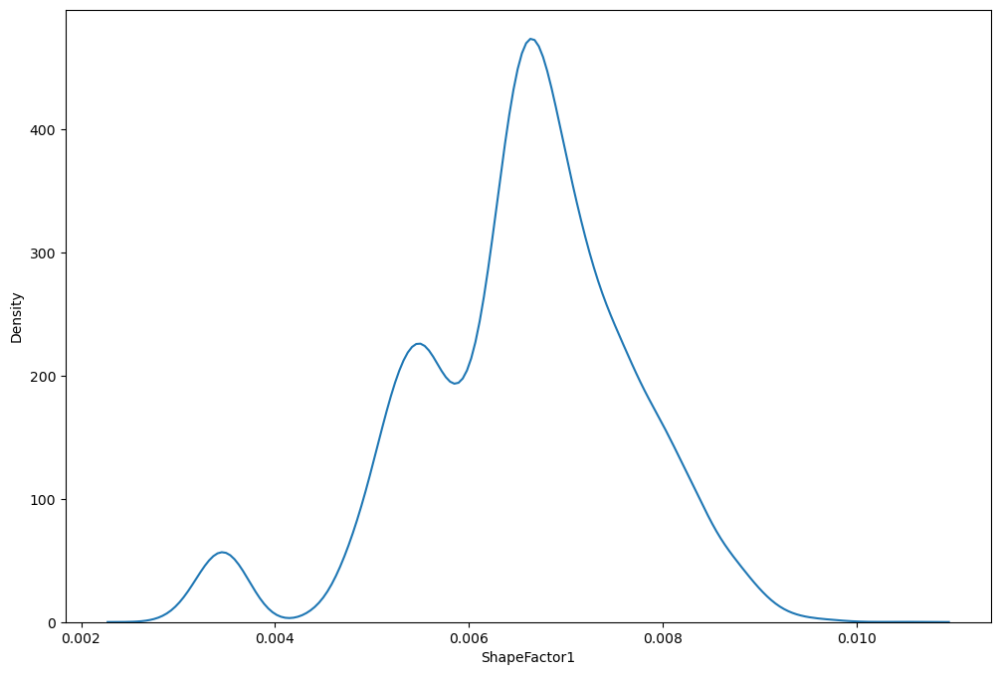

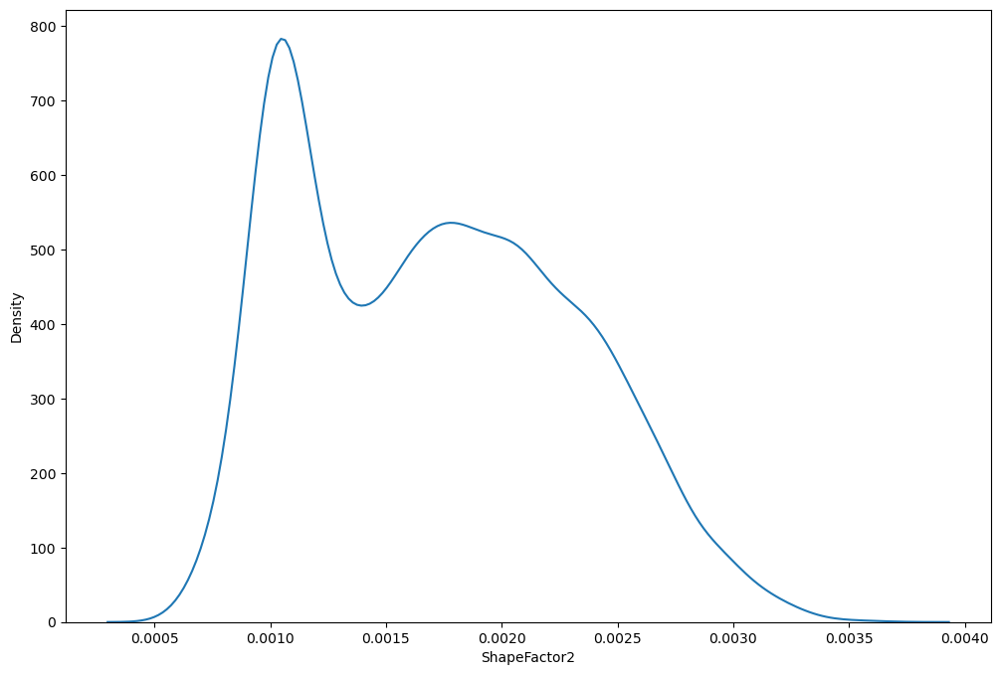

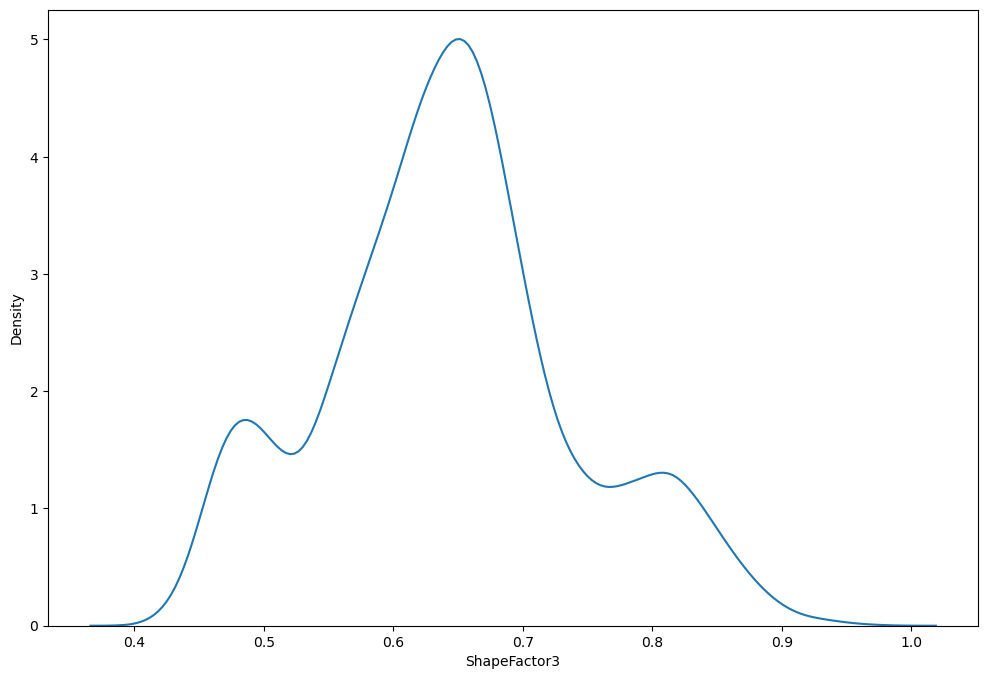

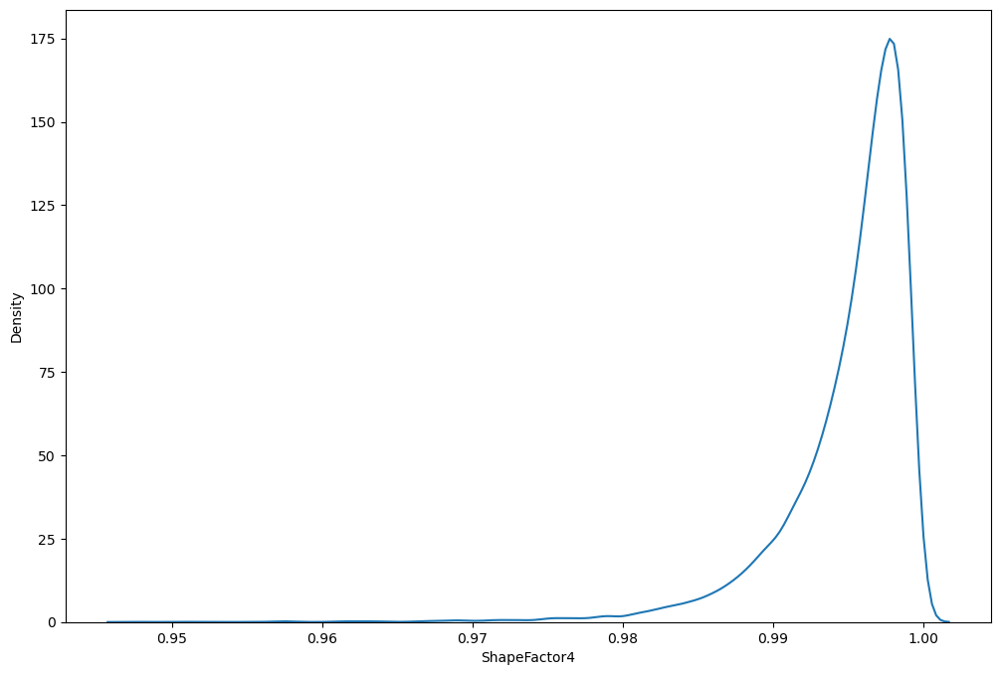

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4'],
      dtype='object')

In [40]:
for i in flottaison.columns:
    plt.figure(figsize=(12, 8))
    sb.kdeplot(flottaison[i])
    plt.show()

flottaison.columns

## Analyses des relations features-target

### Création des sous bases de données

In [43]:
dermason = bean[bean["Class"] == b'DERMASON']
sira = bean[bean["Class"] == b'SIRA']
seker = bean[bean["Class"] == b'SEKER']
horoz = bean[bean["Class"] == b'HOROZ']
cali = bean[bean["Class"] == b'CALI']
barbunya = bean[bean["Class"] == b'BARBUNYA']
bombay = bean[bean["Class"] == b'BOMBAY']

In [44]:
bombay.shape

(522, 17)

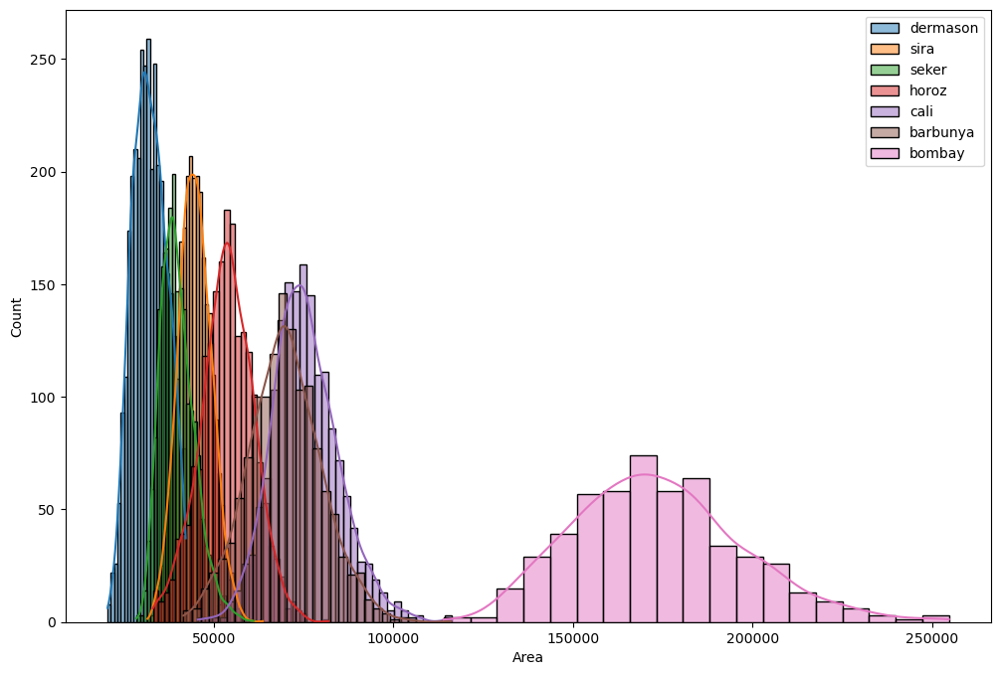

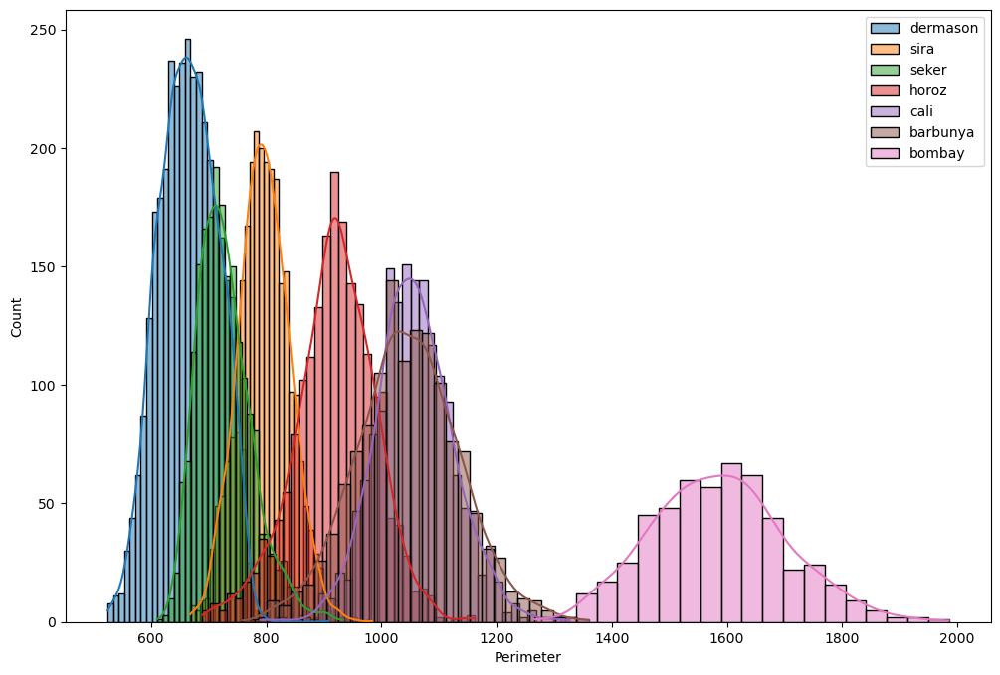

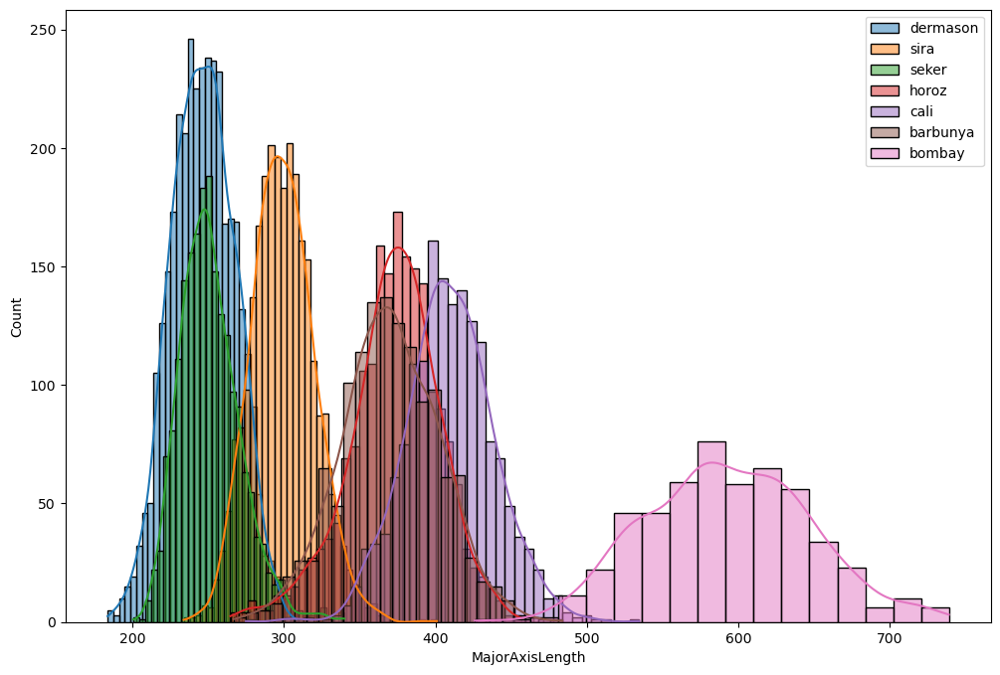

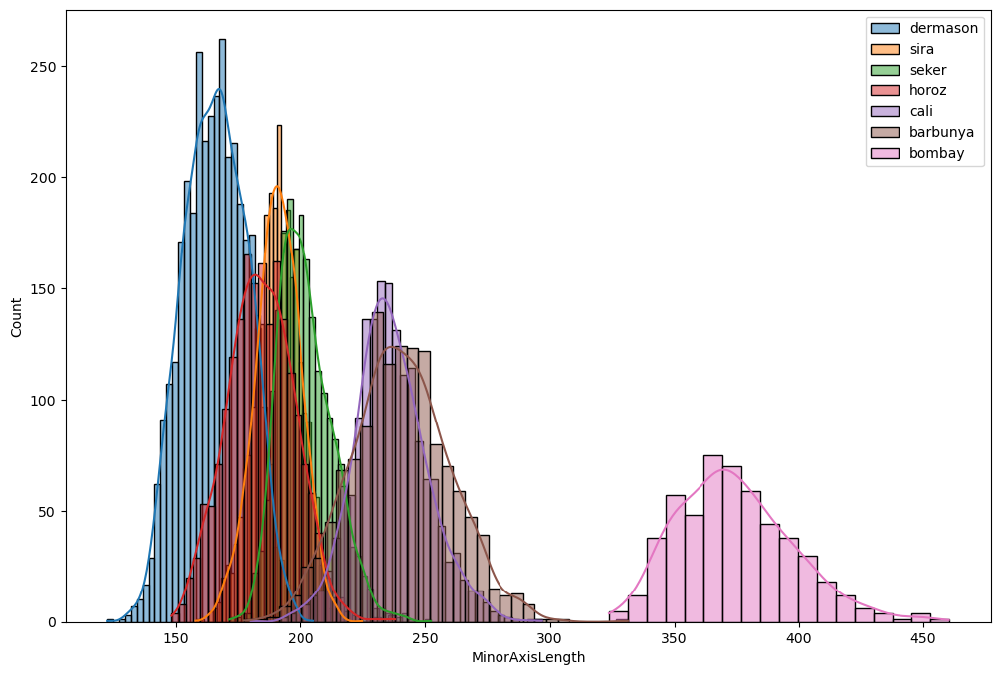

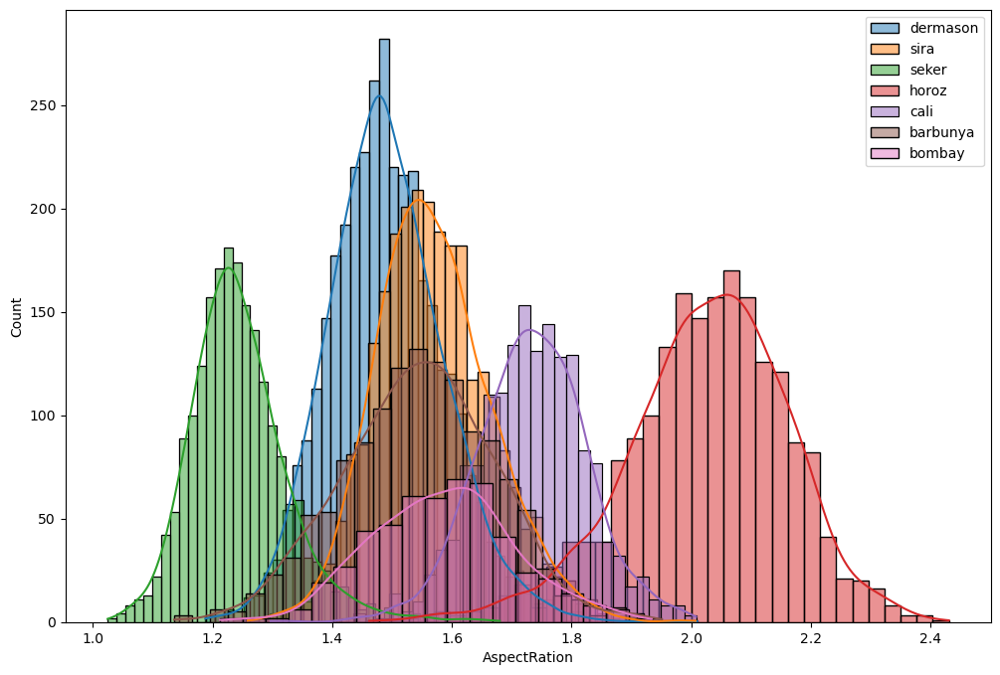

...

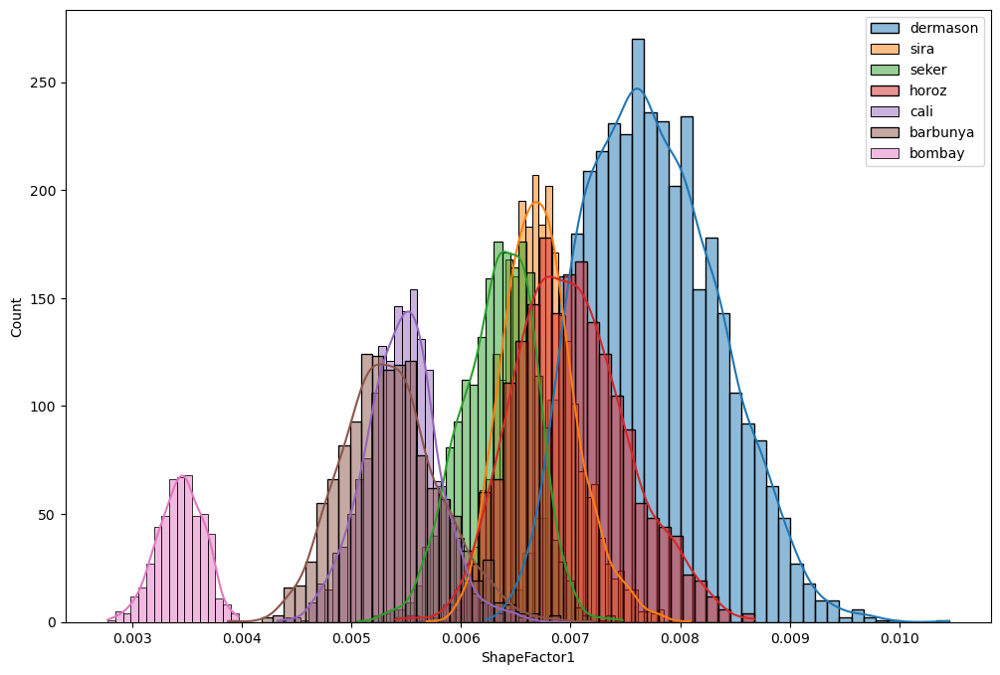

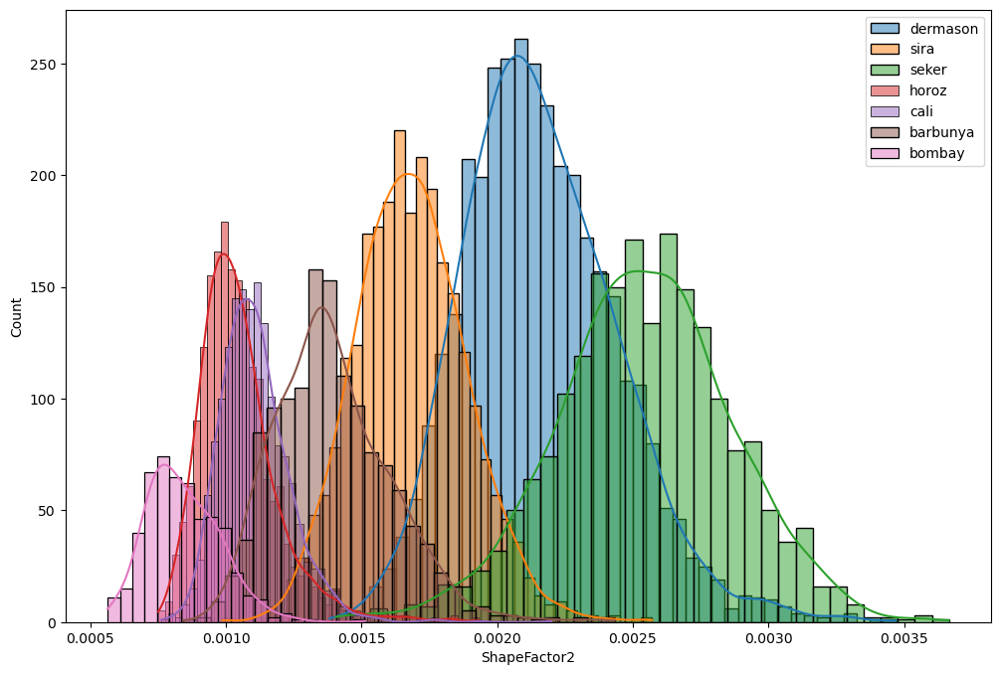

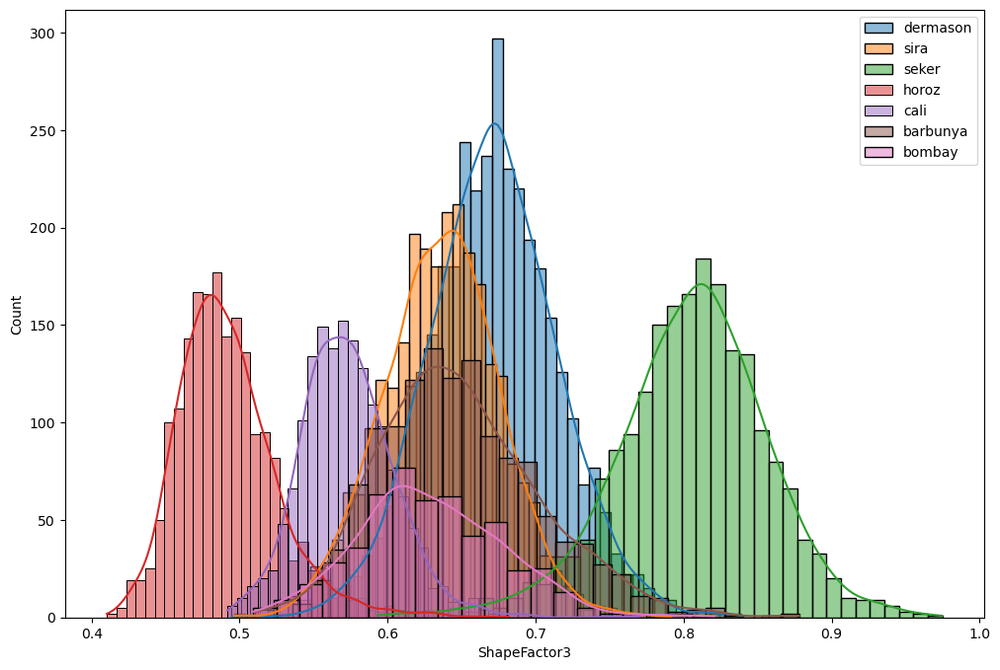

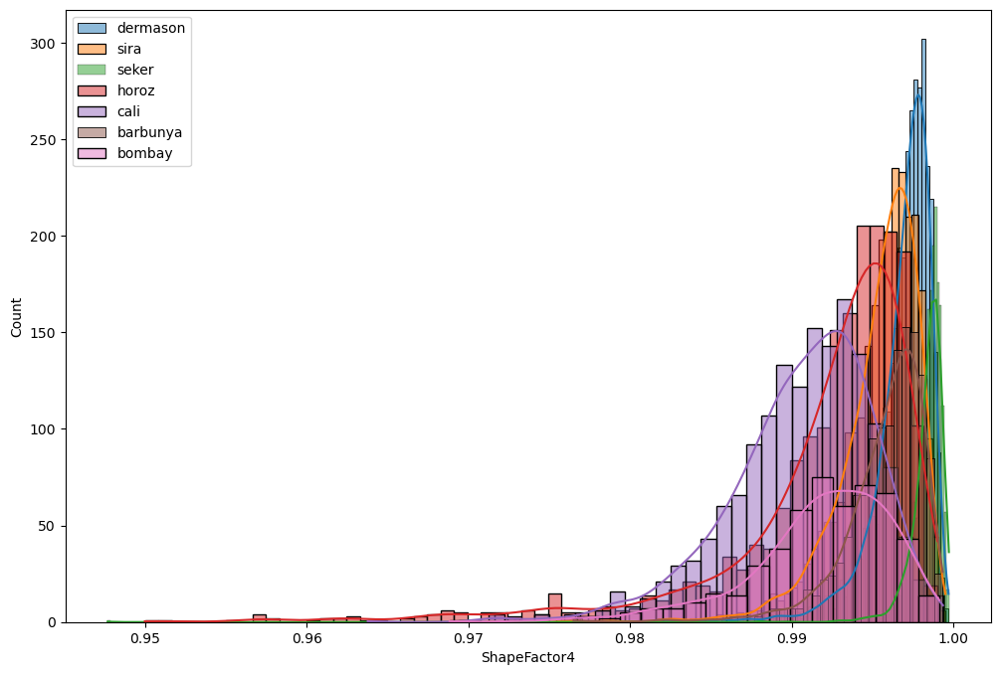

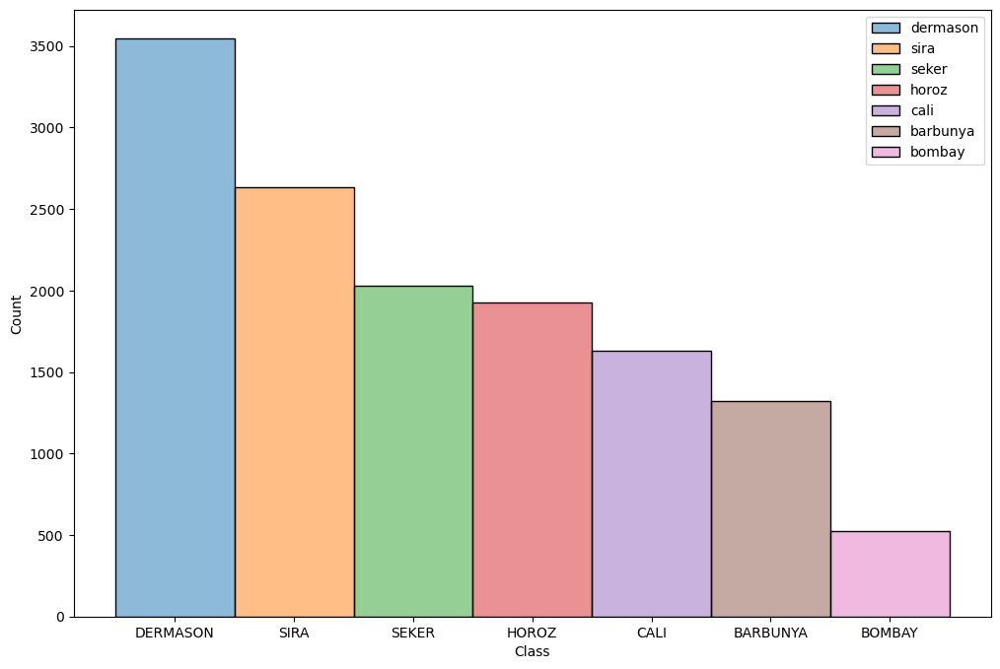

In [45]:
for i in bean.columns:
    plt.figure(figsize=(12, 8))
    sb.histplot(x=i, data=dermason, label= "dermason", kde=True)
    sb.histplot(x=i, data=sira, label="sira", kde=True)
    sb.histplot(x=i, data=seker, label="seker", kde=True)
    sb.histplot(x=i, data=horoz, label="horoz", kde=True)
    sb.histplot(x=i, data=cali, label="cali", kde=True)
    sb.histplot(x=i, data=barbunya, label="barbunya", kde=True)
    sb.histplot(x=i, data=bombay, label="bombay", kde=True)
    plt.legend()
    plt.show()

# Identification des outliers

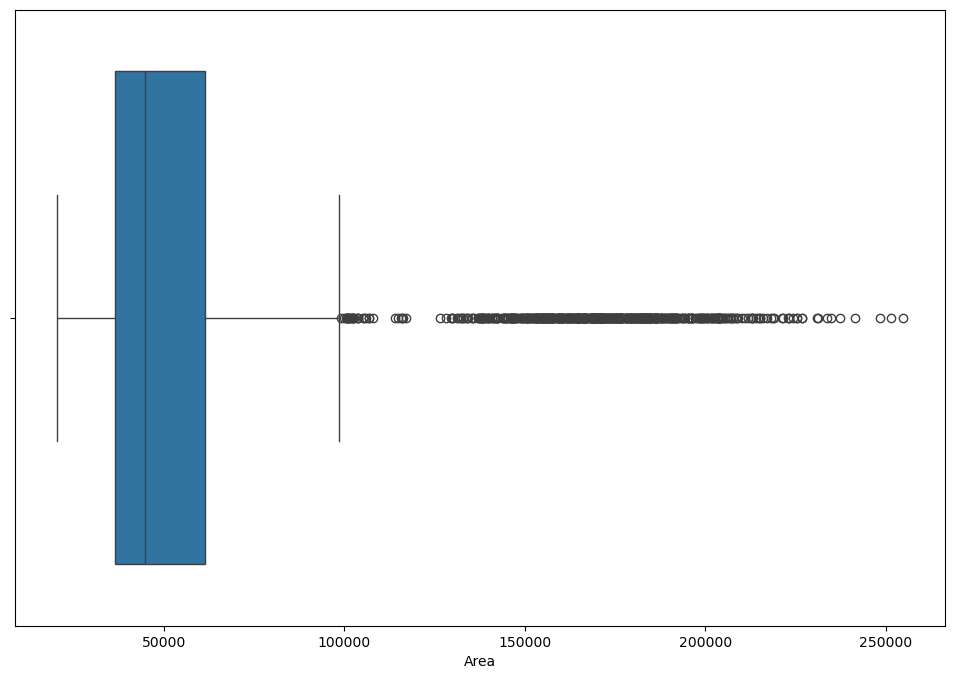

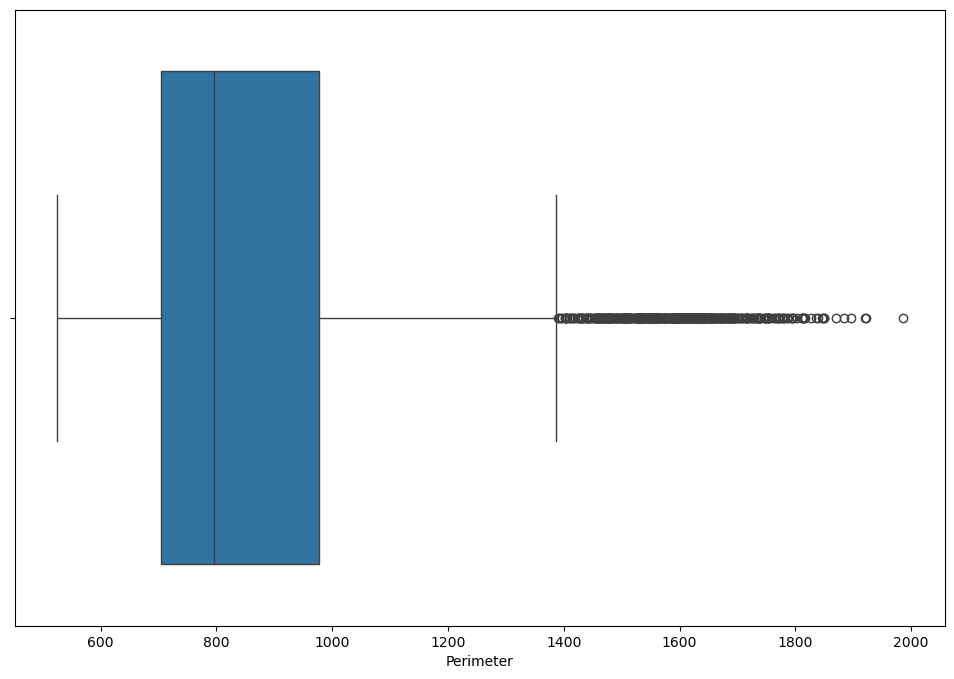

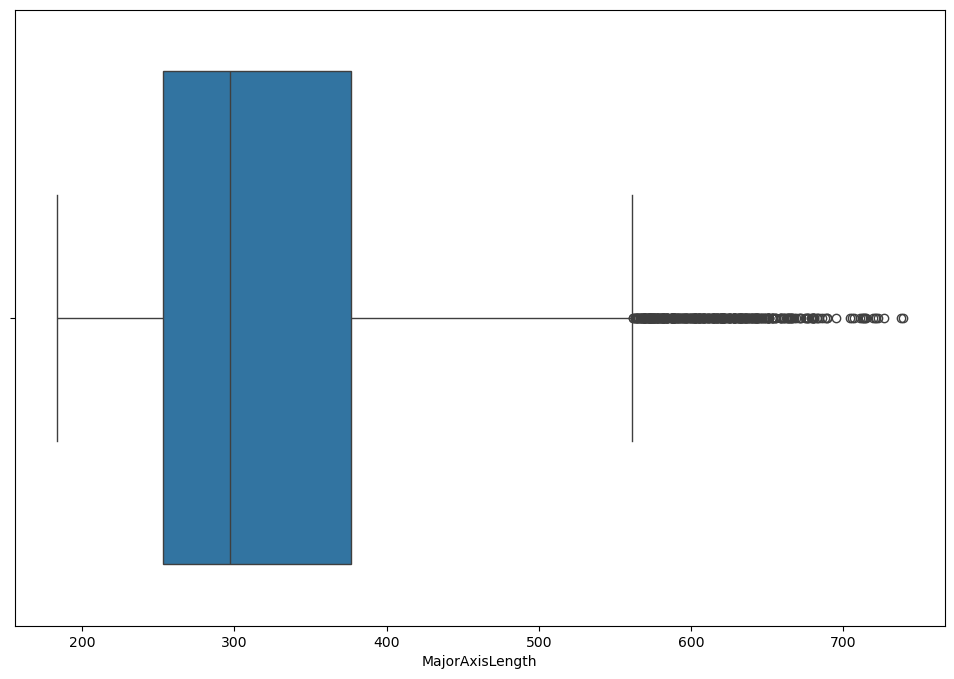

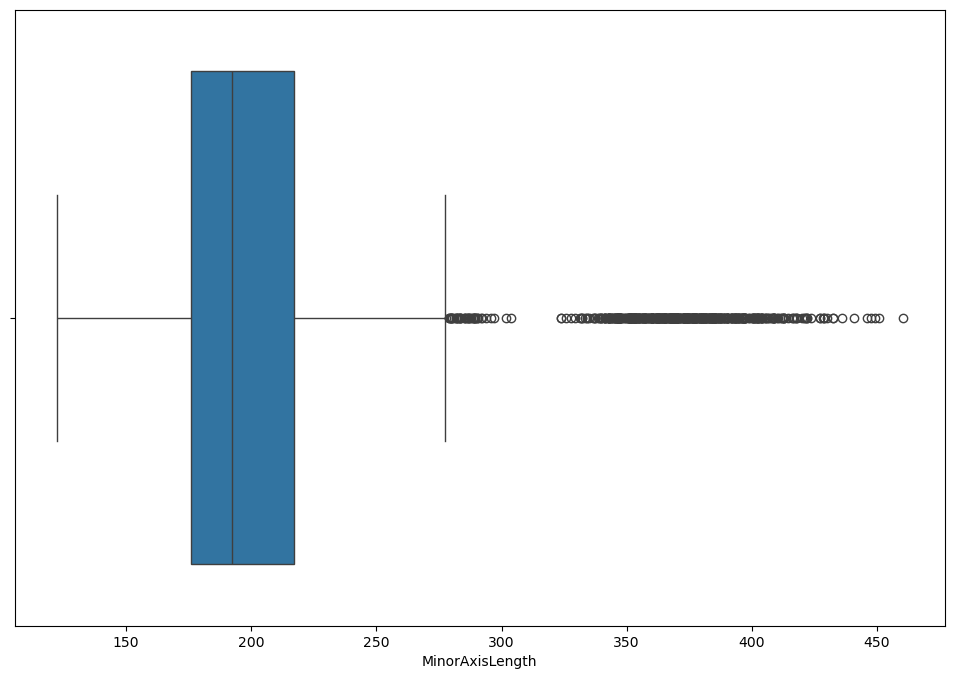

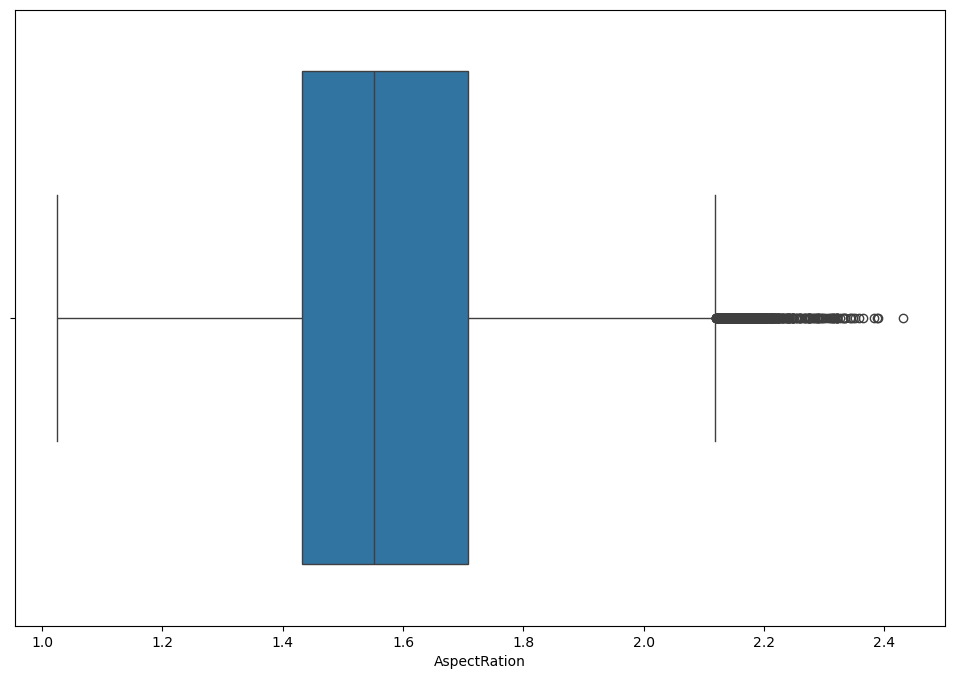

...

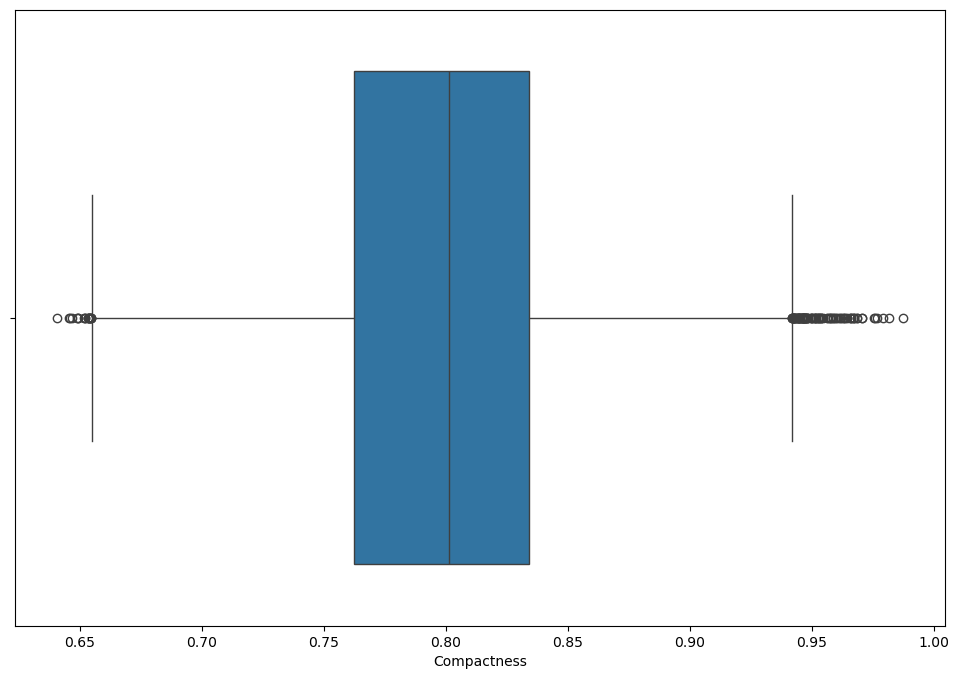

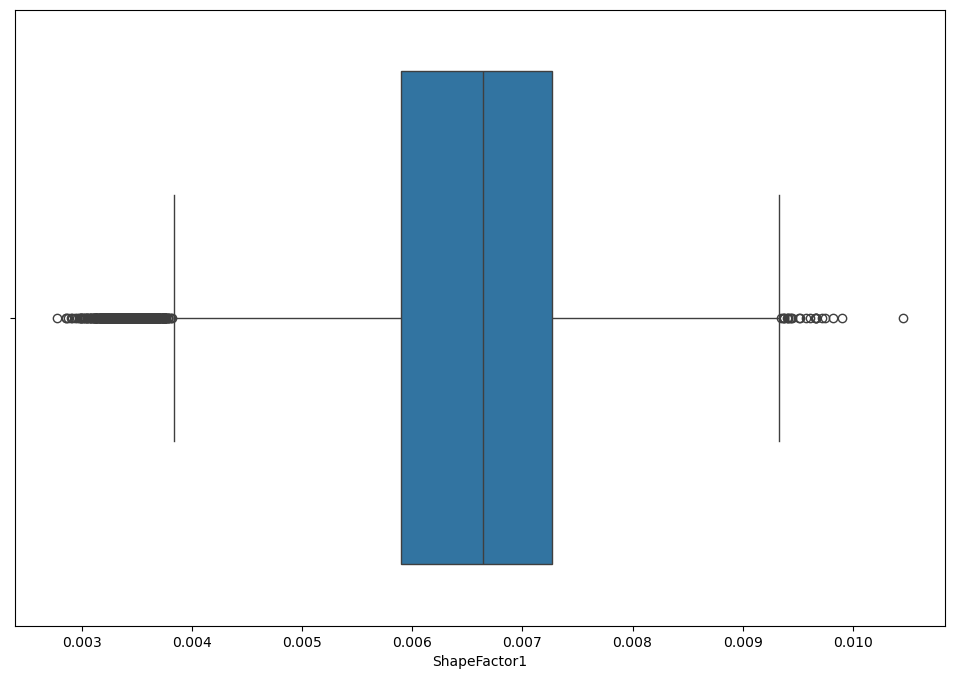

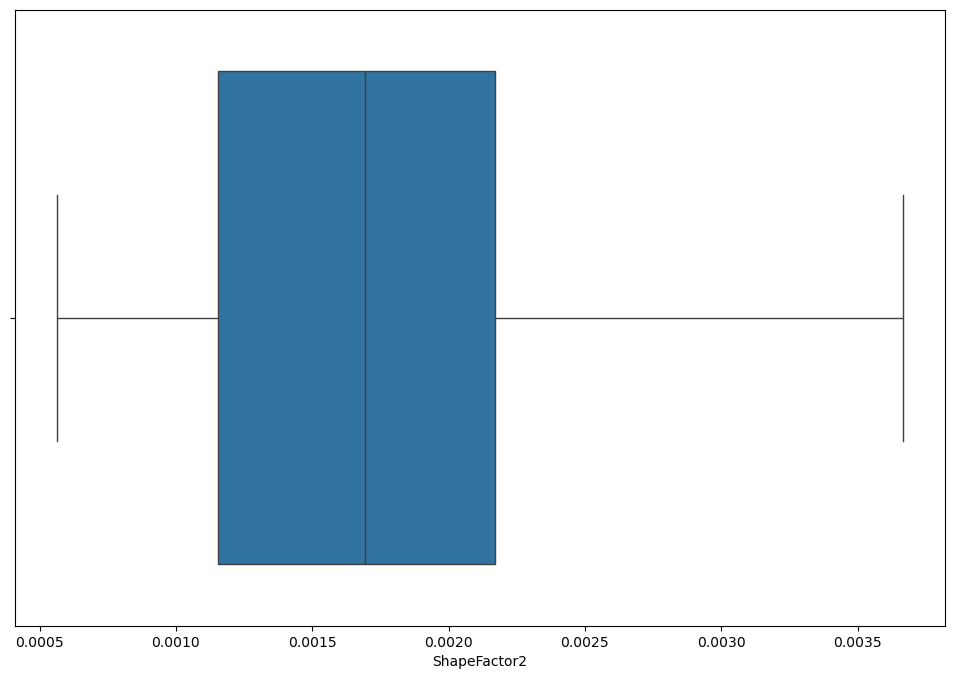

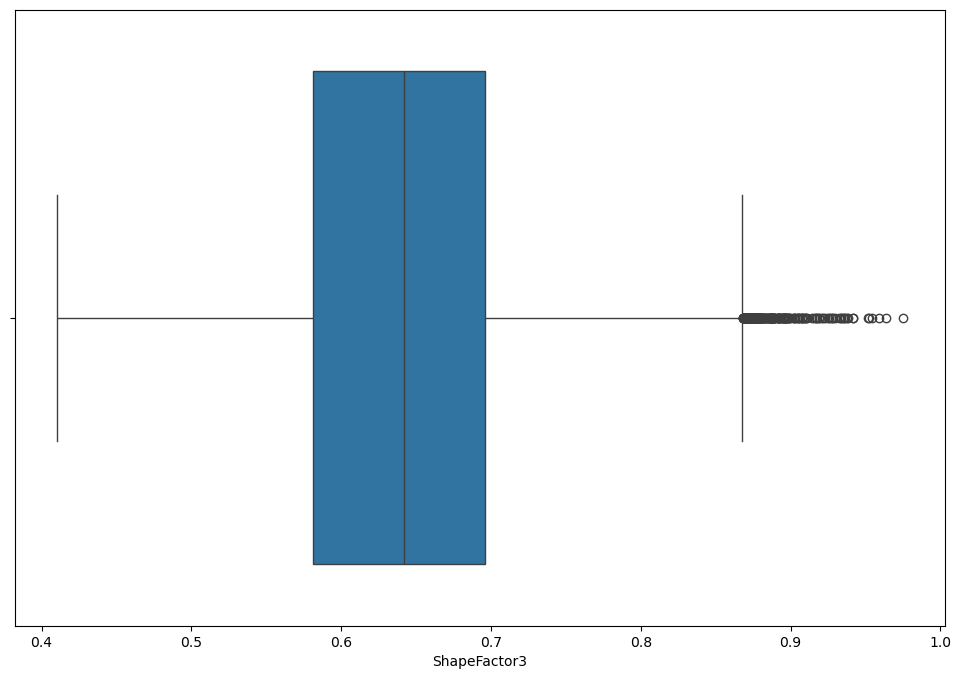

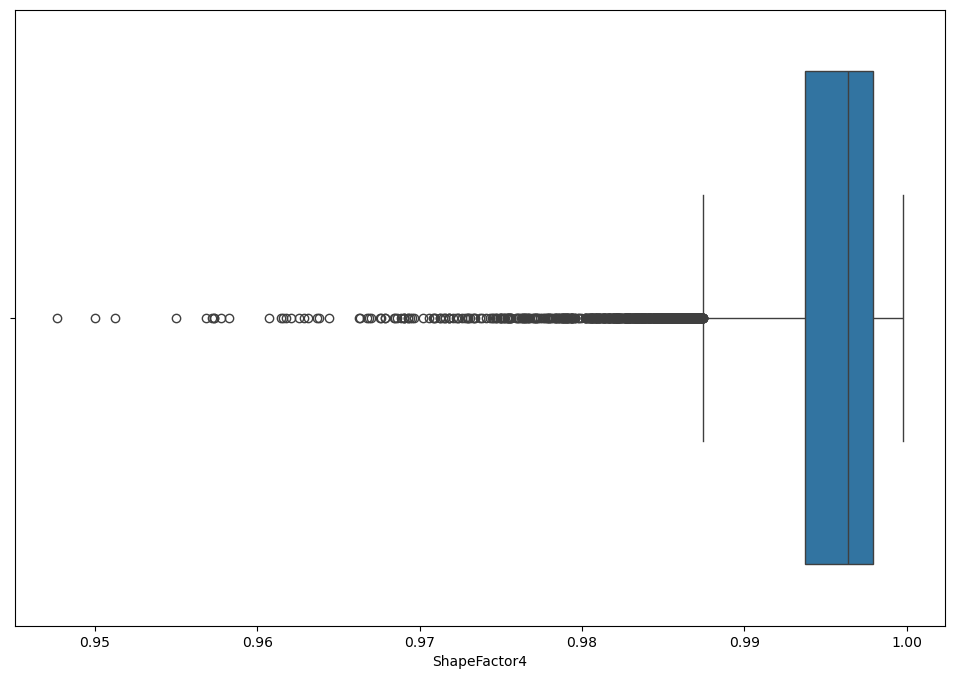

In [50]:
for i in flottaison:
    plt.figure(figsize=(12, 8))
    sb.boxplot(x=i, data=flottaison)
    plt.show()

# Analyse poussée
## Analyse variables/variables
- Beaucoup de valeurs ont de fortes corrélation.
## Analyse des NaNs
- Pas de NaNs
## Hypothèses nulles (H0)
- Hypothèses nulles:
  - L'espèce de bumbay possède des distributions Area, Perimeter, MajorAxisLenght, MinorAxisLength, ConvexArea, EquivDiameter, ShapeFactor1 significativement différents selon les espèces:
    - H0: Les distributions d'Area, Perimeter, MajorAxisLenght, MinorAxisLength, ConvexArea, EquivDiameter, ShapeFactor1 sont identiques: Hypothèses rejetées.
  - Les espèces Seker et Horoz possède des distributions Eccentricty, compactness, ShapeFactor3 significativement différents de celles des autres:
    - H0: Les distribution d' Eccentricty, compactness, ShapeFactor3 sont identiques.

## Analyse variables/variables

In [53]:
flottaison.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,1.000000,0.966722,0.931834,0.951602,0.241735,0.267481,0.999939,0.984968,0.054345,-0.196585,-0.357530,-0.268067,-0.847958,-0.639291,-0.272145,-0.355721
Perimeter,0.966722,1.000000,0.977338,0.913179,0.385276,0.391066,0.967689,0.991380,-0.021160,-0.303970,-0.547647,-0.406857,-0.864623,-0.767592,-0.408435,-0.429310
MajorAxisLength,0.931834,0.977338,1.000000,0.826052,0.550335,0.541972,0.932607,0.961733,-0.078062,-0.284302,-0.596358,-0.568377,-0.773609,-0.859238,-0.568185,-0.482527
MinorAxisLength,0.951602,0.913179,0.826052,1.000000,-0.009161,0.019574,0.951339,0.948539,0.145957,-0.155831,-0.210344,-0.015066,-0.947204,-0.471347,-0.019326,-0.263749
AspectRation,0.241735,0.385276,0.550335,-0.009161,1.000000,0.924293,0.243301,0.303647,-0.370184,-0.267754,-0.766979,-0.987687,0.024593,-0.837841,-0.978592,-0.449264
Eccentricity,0.267481,0.391066,0.541972,0.019574,0.924293,1.000000,0.269255,0.318667,-0.319362,-0.297592,-0.722272,-0.970313,0.019920,-0.860141,-0.981058,-0.449354
ConvexArea,0.999939,0.967689,0.932607,0.951339,0.243301,0.269255,1.000000,0.985226,0.052564,-0.206191,-0.362083,-0.269922,-0.847950,-0.640862,-0.274024,-0.362049
EquivDiameter,0.984968,0.991380,0.961733,0.948539,0.303647,0.318667,0.985226,1.000000,0.028383,-0.231648,-0.435945,-0.327650,-0.892741,-0.713069,-0.330389,-0.392512
Extent,0.054345,-0.021160,-0.078062,0.145957,-0.370184,-0.319362,0.052564,0.028383,1.000000,0.191389,0.344411,0.354212,-0.141616,0.237956,0.347624,0.148502
Solidity,-0.196585,-0.303970,-0.284302,-0.155831,-0.267754,-0.297592,-0.206191,-0.231648,0.191389,1.000000,0.607150,0.303766,0.153388,0.343559,0.307662,0.702163


<Axes: >

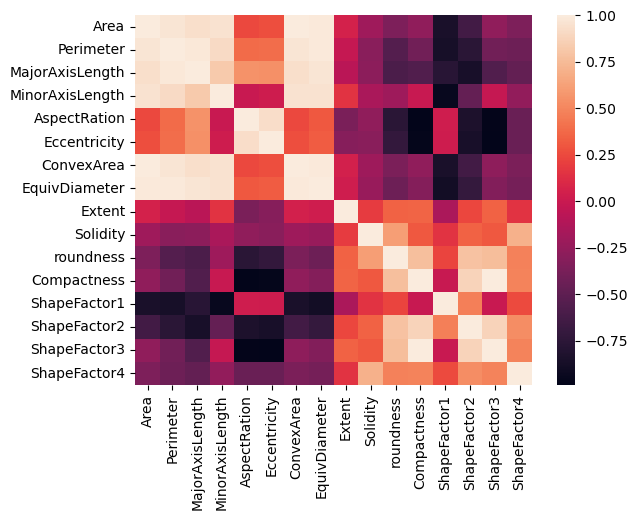

In [54]:
sb.heatmap(flottaison.corr())

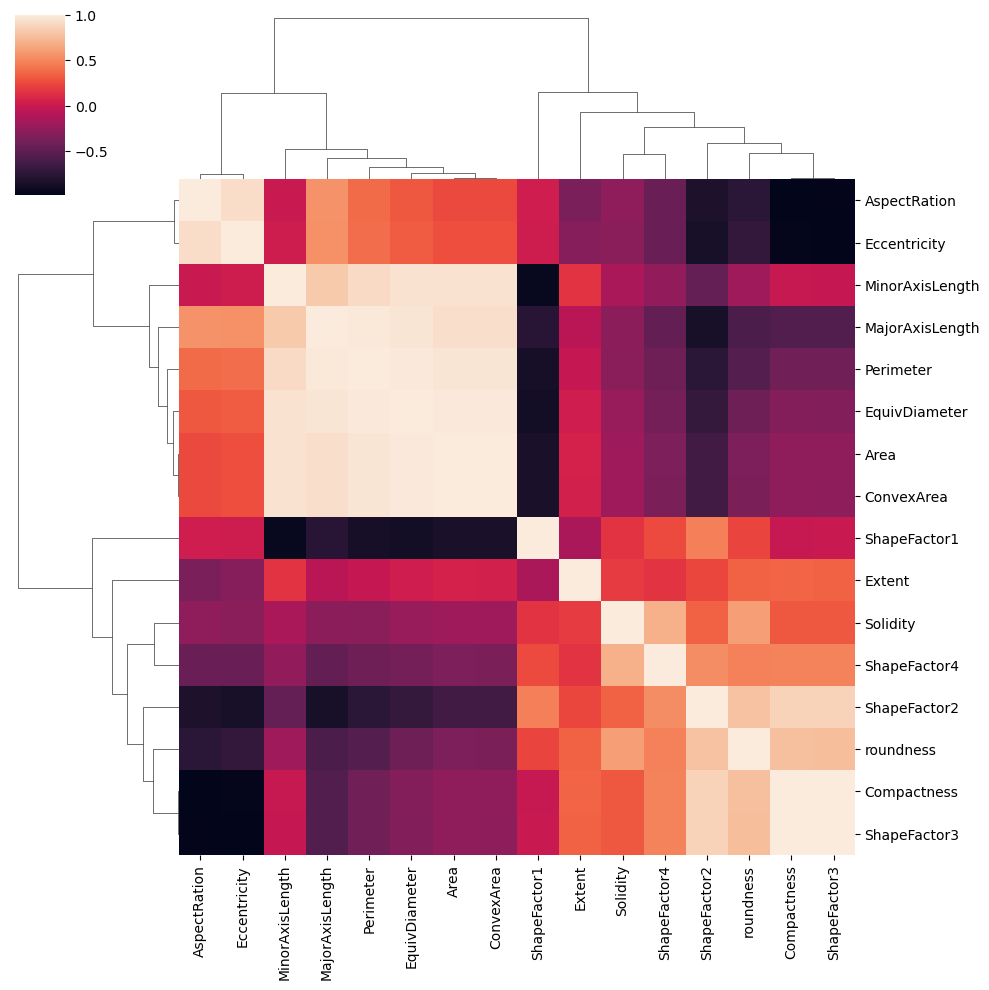

In [55]:
sb.clustermap(flottaison.corr())

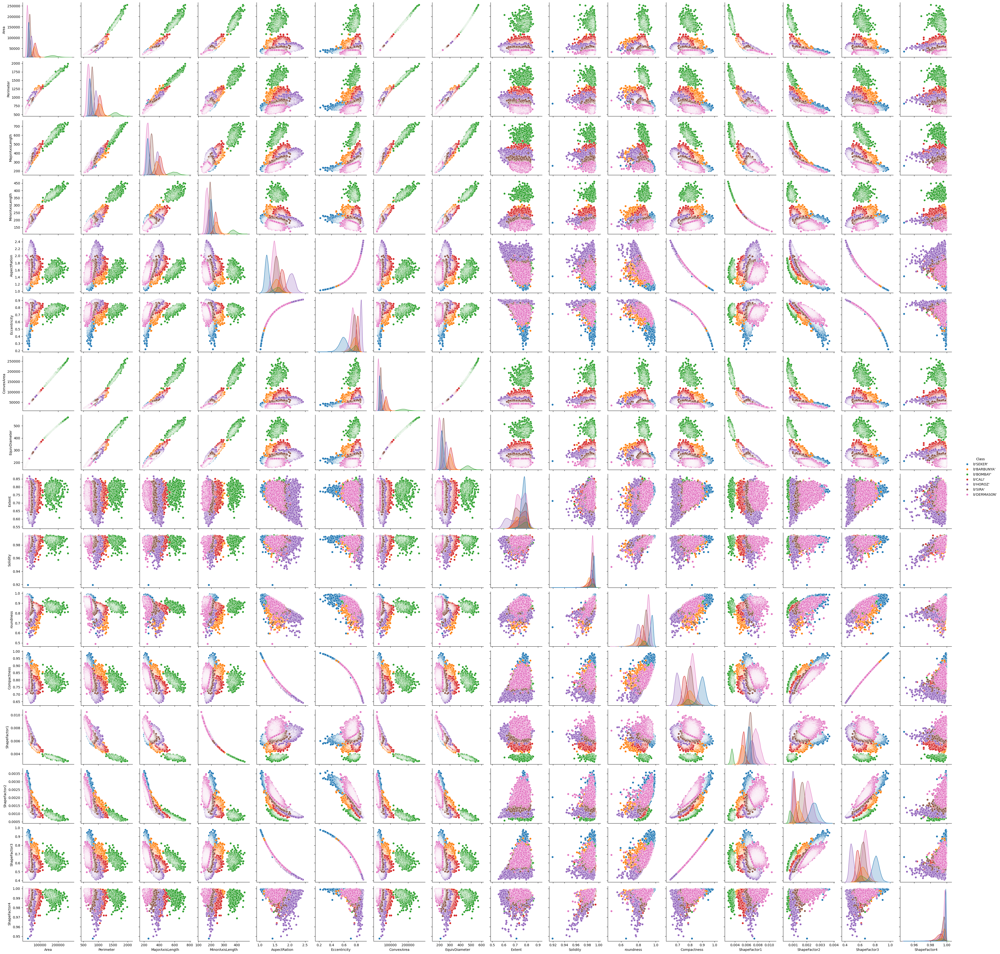

In [56]:
sb.pairplot(bean, hue="Class")

## Vérification des hypothèses

### Hypothèse I

In [59]:
from scipy.stats import ttest_ind

In [60]:
bean["Class"].value_counts()

Class
b'DERMASON'    3546
b'SIRA'        2636
b'SEKER'       2027
b'HOROZ'       1928
b'CALI'        1630
b'BARBUNYA'    1322
b'BOMBAY'       522
Name: count, dtype: int64

In [61]:
dermason_sample = dermason.sample(522)
sira_sample = sira.sample(522)
seker_sample = seker.sample(522)
horoz_sample = horoz.sample(522)
cali_sample = cali.sample(522)
barbunya_sample = barbunya.sample(522)

In [62]:
def test(col, dataset):
    alpha = 0.02
    stat, p =ttest_ind(bombay[col], dataset[col])
    if p < alpha:
        print(col)
        return f"{col:-<50} H0 rejetée"
    else:
        return f"{col:-<50} H0 acceptée"

In [63]:
print("Dermason")
for i in flottaison.columns:
    print(test(i, dermason_sample))

Dermason
Area
Area---------------------------------------------- H0 rejetée
Perimeter
Perimeter----------------------------------------- H0 rejetée
MajorAxisLength
MajorAxisLength----------------------------------- H0 rejetée
MinorAxisLength
MinorAxisLength----------------------------------- H0 rejetée
AspectRation
AspectRation-------------------------------------- H0 rejetée
Eccentricity
Eccentricity-------------------------------------- H0 rejetée
ConvexArea
ConvexArea---------------------------------------- H0 rejetée
EquivDiameter
EquivDiameter------------------------------------- H0 rejetée
Extent
Extent-------------------------------------------- H0 rejetée
Solidity
Solidity------------------------------------------ H0 rejetée
roundness
roundness----------------------------------------- H0 rejetée
Compactness
Compactness--------------------------------------- H0 rejetée
ShapeFactor1
ShapeFactor1-------------------------------------- H0 rejetée
ShapeFactor2
ShapeFactor2-----------

In [64]:
print("Sira")
for i in flottaison.columns:
    print(test(i, sira_sample))

Sira
Area
Area---------------------------------------------- H0 rejetée
Perimeter
Perimeter----------------------------------------- H0 rejetée
MajorAxisLength
MajorAxisLength----------------------------------- H0 rejetée
MinorAxisLength
MinorAxisLength----------------------------------- H0 rejetée
AspectRation
AspectRation-------------------------------------- H0 rejetée
Eccentricity
Eccentricity-------------------------------------- H0 rejetée
ConvexArea
ConvexArea---------------------------------------- H0 rejetée
EquivDiameter
EquivDiameter------------------------------------- H0 rejetée
Extent
Extent-------------------------------------------- H0 rejetée
Solidity
Solidity------------------------------------------ H0 rejetée
roundness
roundness----------------------------------------- H0 rejetée
Compactness
Compactness--------------------------------------- H0 rejetée
ShapeFactor1
ShapeFactor1-------------------------------------- H0 rejetée
ShapeFactor2
ShapeFactor2---------------

In [65]:
print("Seker")
for i in flottaison.columns:
    print(test(i, seker_sample))

Seker
Area
Area---------------------------------------------- H0 rejetée
Perimeter
Perimeter----------------------------------------- H0 rejetée
MajorAxisLength
MajorAxisLength----------------------------------- H0 rejetée
MinorAxisLength
MinorAxisLength----------------------------------- H0 rejetée
AspectRation
AspectRation-------------------------------------- H0 rejetée
Eccentricity
Eccentricity-------------------------------------- H0 rejetée
ConvexArea
ConvexArea---------------------------------------- H0 rejetée
EquivDiameter
EquivDiameter------------------------------------- H0 rejetée
Extent-------------------------------------------- H0 acceptée
Solidity
Solidity------------------------------------------ H0 rejetée
roundness
roundness----------------------------------------- H0 rejetée
Compactness
Compactness--------------------------------------- H0 rejetée
ShapeFactor1
ShapeFactor1-------------------------------------- H0 rejetée
ShapeFactor2
ShapeFactor2--------------------

In [66]:
print("Horoz")
for i in flottaison.columns:
    print(test(i, horoz_sample))

Horoz
Area
Area---------------------------------------------- H0 rejetée
Perimeter
Perimeter----------------------------------------- H0 rejetée
MajorAxisLength
MajorAxisLength----------------------------------- H0 rejetée
MinorAxisLength
MinorAxisLength----------------------------------- H0 rejetée
AspectRation
AspectRation-------------------------------------- H0 rejetée
Eccentricity
Eccentricity-------------------------------------- H0 rejetée
ConvexArea
ConvexArea---------------------------------------- H0 rejetée
EquivDiameter
EquivDiameter------------------------------------- H0 rejetée
Extent
Extent-------------------------------------------- H0 rejetée
Solidity
Solidity------------------------------------------ H0 rejetée
roundness
roundness----------------------------------------- H0 rejetée
Compactness
Compactness--------------------------------------- H0 rejetée
ShapeFactor1
ShapeFactor1-------------------------------------- H0 rejetée
ShapeFactor2
ShapeFactor2--------------

In [67]:
print("Cali")
for i in flottaison.columns:
    print(test(i, cali_sample))

Cali
Area
Area---------------------------------------------- H0 rejetée
Perimeter
Perimeter----------------------------------------- H0 rejetée
MajorAxisLength
MajorAxisLength----------------------------------- H0 rejetée
MinorAxisLength
MinorAxisLength----------------------------------- H0 rejetée
AspectRation
AspectRation-------------------------------------- H0 rejetée
Eccentricity
Eccentricity-------------------------------------- H0 rejetée
ConvexArea
ConvexArea---------------------------------------- H0 rejetée
EquivDiameter
EquivDiameter------------------------------------- H0 rejetée
Extent
Extent-------------------------------------------- H0 rejetée
Solidity
Solidity------------------------------------------ H0 rejetée
roundness
roundness----------------------------------------- H0 rejetée
Compactness
Compactness--------------------------------------- H0 rejetée
ShapeFactor1
ShapeFactor1-------------------------------------- H0 rejetée
ShapeFactor2
ShapeFactor2---------------

In [68]:
print("Barnuya")
for i in flottaison.columns:
    print(test(i, barbunya_sample))

Barnuya
Area
Area---------------------------------------------- H0 rejetée
Perimeter
Perimeter----------------------------------------- H0 rejetée
MajorAxisLength
MajorAxisLength----------------------------------- H0 rejetée
MinorAxisLength
MinorAxisLength----------------------------------- H0 rejetée
AspectRation
AspectRation-------------------------------------- H0 rejetée
Eccentricity
Eccentricity-------------------------------------- H0 rejetée
ConvexArea
ConvexArea---------------------------------------- H0 rejetée
EquivDiameter
EquivDiameter------------------------------------- H0 rejetée
Extent
Extent-------------------------------------------- H0 rejetée
Solidity
Solidity------------------------------------------ H0 rejetée
roundness
roundness----------------------------------------- H0 rejetée
Compactness
Compactness--------------------------------------- H0 rejetée
ShapeFactor1
ShapeFactor1-------------------------------------- H0 rejetée
ShapeFactor2
ShapeFactor2------------

# Préprocessing

In [70]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [71]:
X= flottaison
y = bean["Class"]
y= pd.get_dummies(y)

In [73]:
X

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395.0,610.291,208.178117,173.888747,1.197191,0.549812,28715.0,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,28734.0,638.018,200.524796,182.734419,1.097356,0.411785,29172.0,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,29380.0,624.110,212.826130,175.931143,1.209713,0.562727,29690.0,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
3,30008.0,645.884,210.557999,182.516516,1.153638,0.498616,30724.0,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199
4,30140.0,620.134,201.847882,190.279279,1.060798,0.333680,30417.0,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097.0,759.696,288.721612,185.944705,1.552728,0.765002,42508.0,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385
13607,42101.0,757.499,281.576392,190.713136,1.476439,0.735702,42494.0,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219
13608,42139.0,759.321,281.539928,191.187979,1.472582,0.734065,42569.0,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767
13609,42147.0,763.779,283.382636,190.275731,1.489326,0.741055,42667.0,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222


In [74]:
y

,b'BARBUNYA',b'BOMBAY',b'CALI',b'DERMASON',b'HOROZ',b'SEKER',b'SIRA'
0,False,False,False,False,False,True,False
1,False,False,False,False,False,True,False
2,False,False,False,False,False,True,False
3,False,False,False,False,False,True,False
4,False,False,False,False,False,True,False
...,...,...,...,...,...,...,...
13606,False,False,False,True,False,False,False
13607,False,False,False,True,False,False,False
13608,False,False,False,True,False,False,False
13609,False,False,False,True,False,False,False


In [75]:
labeliseur = LabelEncoder()
standardiseur = StandardScaler()

In [76]:
X= standardiseur.fit_transform(X)

In [77]:
import tensorflow as tf
from tensorflow import keras

In [78]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, GroupKFold

In [79]:
model_1 = keras.models.Sequential([
    keras.layers.Input(shape=[16]),
    keras.layers.Dense(50, activation="relu"),
    keras.layers.Dense(30, activation="relu"),
    keras.layers.Dense(7, activation="softmax")
])

In [81]:
model_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 50)                  │             850 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 30)                  │           1,530 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 7)                   │             217 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,597 (10.14 KB)

 Trainable params: 2,597 (10.14 KB)

 Non-trainable params: 0 (0.00 B)

In [83]:
model_1.compile(loss="categorical_crossentropy", optimizer="sgd")

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
early = keras.callbacks.EarlyStopping(patience=25)

In [86]:
history = model_1.fit(X_train, y_train, batch_size=32, epochs=120, validation_split=0.1, callbacks=[early])

Epoch 1/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 1.3901 - val_loss: 0.7234
Epoch 2/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6293 - val_loss: 0.4535
Epoch 3/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4163 - val_loss: 0.3399
Epoch 4/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.3159 - val_loss: 0.2886
Epoch 5/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2682 - val_loss: 0.2637
Epoch 6/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2539 - val_loss: 0.2492
Epoch 7/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2401 - val_loss: 0.2400
Epoch 8/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2252 - val_loss: 0.2347
Epoch 9/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2173 - val_loss: 0.2310
Epoch 10/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2224 - val_loss: 0.2295
Epoch 11/120
307/307 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2200 - val_loss: 0.2280
Epoch 12/120
307/307 ━━━━━━━━━━━━━━━━━━━━

In [88]:
X_test_, X_new, y_test_, y_new = train_test_split(X_test, y_test, test_size=0.1, random_state=0)

In [89]:
model_1.fit(X_test_, y_test_)

77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1779


In [90]:
y_pred = model_1.predict(X_new)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


In [91]:
import numpy as np

In [92]:
classe = ['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [93]:
for i in y_pred:
    print(np.argmax(i))

0
4
3
3
6
3
2
3
3
5
5
3
3
1
5
4
4
2
3
3
3
2
6
5
4
3
6
5
1
6
6
1
2
4
6
3
1
3
6
2
3
3
6
0
5
3
0
4
3
5
4
4
6
3
4
2
5
4
3
6
5
4
6
0
3
4
1
5
6
2
6
2
3
0
2
4
5
6
3
1
0
2
6
0
3
3
5
2
2
3
5
0
5
1
3
0
5
0
4
5
3
3
5
3
2
6
2
4
6
4
0
4
2
2
3
2
6
5
3
3
3
5
6
4
3
5
2
0
6
4
3
2
3
2
2
4
1
5
4
2
4
4
5
5
3
3
2
3
0
5
1
6
3
0
2
6
2
4
1
5
2
2
6
3
2
3
4
2
6
3
5
4
2
5
2
4
0
5
6
3
0
0
0
5
5
6
2
3
0
0
6
6
2
3
6
4
6
3
4
3
5
2
3
2
5
3
0
6
5
2
4
3
4
6
1
5
4
6
3
4
5
3
4
4
3
3
6
6
0
3
6
0
3
0
3
3
6
2
5
3
6
3
3
6
5
3
3
6
6
6
3
3
1
2
3
3
5
4
3
1
2
6
5
2
5
3
2
3
3
6
6
6
3


In [94]:
for i in y_pred:
    print(classe[np.argmax(i)])

BARBUNYA
HOROZ
DERMASON
DERMASON
SIRA
DERMASON
CALI
DERMASON
DERMASON
SEKER
SEKER
DERMASON
DERMASON
BOMBAY
SEKER
HOROZ
HOROZ
CALI
DERMASON
DERMASON
DERMASON
CALI
SIRA
SEKER
HOROZ
DERMASON
SIRA
SEKER
BOMBAY
SIRA
SIRA
BOMBAY
CALI
HOROZ
SIRA
DERMASON
BOMBAY
DERMASON
SIRA
CALI
DERMASON
DERMASON
SIRA
BARBUNYA
SEKER
DERMASON
BARBUNYA
HOROZ
DERMASON
SEKER
HOROZ
HOROZ
SIRA
DERMASON
HOROZ
CALI
SEKER
HOROZ
DERMASON
SIRA
SEKER
HOROZ
SIRA
BARBUNYA
DERMASON
HOROZ
BOMBAY
SEKER
SIRA
CALI
SIRA
CALI
DERMASON
BARBUNYA
CALI
HOROZ
SEKER
SIRA
DERMASON
BOMBAY
BARBUNYA
CALI
SIRA
BARBUNYA
DERMASON
DERMASON
SEKER
CALI
CALI
DERMASON
SEKER
BARBUNYA
SEKER
BOMBAY
DERMASON
BARBUNYA
SEKER
BARBUNYA
HOROZ
SEKER
DERMASON
DERMASON
SEKER
DERMASON
CALI
SIRA
CALI
HOROZ
SIRA
HOROZ
BARBUNYA
HOROZ
CALI
CALI
DERMASON
CALI
SIRA
SEKER
DERMASON
DERMASON
DERMASON
SEKER
SIRA
HOROZ
DERMASON
SEKER
CALI
BARBUNYA
SIRA
HOROZ
DERMASON
CALI
DERMASON
CALI
CALI
HOROZ
BOMBAY
SEKER
HOROZ
CALI
HOROZ
HOROZ
SEKER
SEKER
DERMASON
DERMASON
CALI
DER